In [14]:
import cv2

def crop_and_resize_image(image, img_size, use_3channel=False):
    '''
    각 채널을 받아 크기 조정(512x512 픽셀로 다운샘플링), 
    이미지 크롭 수행(FOV의 직경과 동일한 정사각형),
    각 채널 합치기
    
    img_size=(512, 512)
    '''
    # 3개의 채널 전부 전처리할 경우
    if use_3channel:
        channels = [cv2.resize(image[:, :, i], img_size) for i in range(3)]
        diameter = min(channels[0].shape[0], channels[0].shape[1])
        center_x, center_y = channels[0].shape[1] // 2, channels[0].shape[0] // 2
        crop_size = min(center_x, center_y, diameter // 2)
        cropped_channels = [channel[center_y - crop_size:center_y + crop_size, center_x - crop_size:center_x + crop_size] for channel in channels]
        cropped_image = cv2.merge(cropped_channels)
    
    # 녹색 채널만 전처리할 경우
    else:
        resized_image = cv2.resize(image, img_size)
        diameter = min(resized_image.shape[0], resized_image.shape[1])
        center_x, center_y = resized_image.shape[1] // 2, resized_image.shape[0] // 2
        crop_size = min(center_x, center_y, diameter // 2)
        cropped_image = resized_image[center_y - crop_size:center_y + crop_size, center_x - crop_size:center_x + crop_size]
        
    return cropped_image

def preprocess_image(image_path, img_size=(512, 512), use_hist=True, use_3channel=False):
    '''
    image_path를 받아 이미지를 읽고, 
    각 채널에 대한 대비 향상, 
    크롭 및 크기 조정
    '''
    original_image = cv2.imread(image_path)

    if use_3channel:
        # 모든 채널 가져오기
        channels = [original_image[:, :, i] for i in range(3)]

        # 대비 향상 적용
        if use_hist:
            clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(100, 100))
            contrast_enhanced_channels = [clahe.apply(channel) for channel in channels]

            # 각 채널 합치기
            contrast_enhanced_image = cv2.merge(contrast_enhanced_channels)
            cropped_image = crop_and_resize_image(contrast_enhanced_image, img_size, use_3channel=True)
        else:
            # 각 채널 합치기
            cropped_image = crop_and_resize_image(original_image, img_size, use_3channel=True)
    else:
        # 녹색 채널만 사용
        green_channel = original_image[:, :, 1]

        # 대비 향상 적용
        if use_hist:
            clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(100, 100))
            contrast_enhanced_image = clahe.apply(green_channel)
            cropped_image = crop_and_resize_image(contrast_enhanced_image, img_size, use_3channel=False)
        else:
            cropped_image = crop_and_resize_image(green_channel, img_size, use_3channel=False)

    # 0~1로 scale 맞추기
    cropped_image = cropped_image / 255.0
      
    return cropped_image


In [15]:
import os
import matplotlib.pyplot as plt
import numpy as np

# 이미지 폴더 경로 지정
# image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\FGADR\Seg-set\Original_Images"
image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\IDRiD\A. Segmentation\A. Segmentation\1. Original Images\a. Training Set"

# 폴더 내의 이미지 파일 리스트 가져오기
image_files = os.listdir(image_folder_path)

# 5개의 이미지를 순회하며 표시
for i in range(1):
    # 이미지 파일 경로 생성
    image_path = os.path.join(image_folder_path, image_files[i])

    # 원본 이미지 읽기
    original_image = cv2.imread(image_path)[:, :, ::-1]  # OpenCV는 BGR, Matplotlib은 RGB 순서

    # 3채널 전처리된 이미지 얻기
    preprocessed_image_3channel = preprocess_image(image_path, img_size=(512, 512), use_hist=True, use_3channel=True)

    # uint8로 변환
    preprocessed_image_3channel_uint8 = (preprocessed_image_3channel * 255).astype(np.uint8)
    
    # 이미지를 BGR에서 RGB로 변환
    preprocessed_image_3channel_uint8 = cv2.cvtColor(preprocessed_image_3channel_uint8, cv2.COLOR_BGR2RGB)
    print("변환 후 데이터 타입:", preprocessed_image_3channel_uint8.dtype)
    print("변환 후 데이터 shape:", preprocessed_image_3channel_uint8.shape)

    # 1채널 전처리된 이미지 얻기
    preprocessed_image_1channel = preprocess_image(image_path, img_size=(512, 512), use_hist=True, use_3channel=False)

    # 원본 이미지와 전처리된 이미지 나란히 표시
    plt.figure(figsize=(10, 10))

    # plt.subplot(2, 2, 1)
    # plt.imshow(original_image)
    # plt.title(f'Original Image {i+1}')
    # plt.axis('off')
    # plt.text(0, -0.1, f'Shape: {original_image.shape}\nData Type: {original_image.dtype}', transform=plt.gca().transAxes, fontsize=9, color='black')


    plt.subplot(2, 2, 2)
    plt.imshow(preprocessed_image_3channel_uint8)
    #plt.title(f'Preprocessed (3 Channels) Image {i+1}')
    plt.axis('off')
    #plt.text(0, -0.1, f'Shape: {preprocessed_image_3channel_uint8.shape}\nData Type: {preprocessed_image_3channel_uint8.dtype}', transform=plt.gca().transAxes, fontsize=9, color='black')

    # plt.subplot(2, 3, 3)
    # plt.imshow(preprocessed_image_1channel, cmap='gray')  # 흑백 이미지이므로 'gray' colormap 사용
    # plt.title(f'Preprocessed (1 Channel) Image {i+1}')
    # plt.axis('off')
    # plt.text(0, -0.1, f'Shape: {preprocessed_image_1channel.shape}\nData Type: {preprocessed_image_1channel.dtype}', transform=plt.gca().transAxes, fontsize=9, color='black')

    plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'D:\\VS_Code\\DN_project\\DR-GeuAl\\data\\IDRiD\\A. Segmentation\\A. Segmentation\\1. Original Images\\a. Training Set'

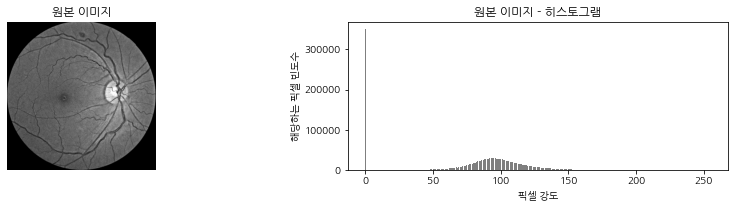

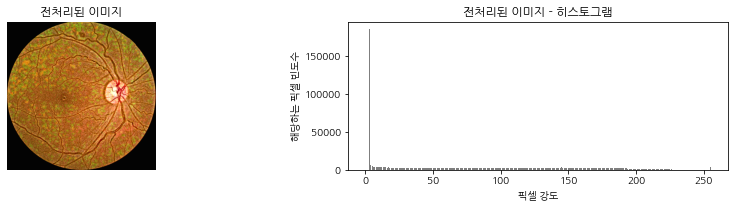

In [19]:
import cv2
import matplotlib.pyplot as plt

def plot_image_and_histogram(image, title):
    # 히스토그램 계산
    hist, bins = np.histogram(image.flatten(), bins=256, range=[0, 256])

    # 이미지 및 히스토그램 막대그래프 플로팅
    plt.figure(figsize=(15, 6))
    
    plt.subplot(2, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title(f'{title}')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.bar(range(256), hist, color='black', alpha=0.5)
    plt.title(f'{title} - 히스토그램')
    plt.xlabel('픽셀 강도')
    plt.ylabel('해당하는 픽셀 빈도수')

    plt.show()

# 이미지 경로
image_path = r"../data/FGADR/Seg-set/Original_Images/0002_1.png"

# 원본 이미지 읽기
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 전처리된 이미지 얻기
preprocessed_image = preprocess_image(image_path, img_size=(512, 512), use_hist=True, use_3channel=True)
# uint8로 변환
preprocessed_image = (preprocessed_image * 255).astype(np.uint8)

# 이미지를 BGR에서 RGB로 변환
preprocessed_image = cv2.cvtColor(preprocessed_image, cv2.COLOR_BGR2RGB)

# 원본 이미지와 전처리된 이미지, 각각의 히스토그램 분포 플로팅
plot_image_and_histogram(original_image, '원본 이미지')
plot_image_and_histogram(preprocessed_image, '전처리된 이미지')


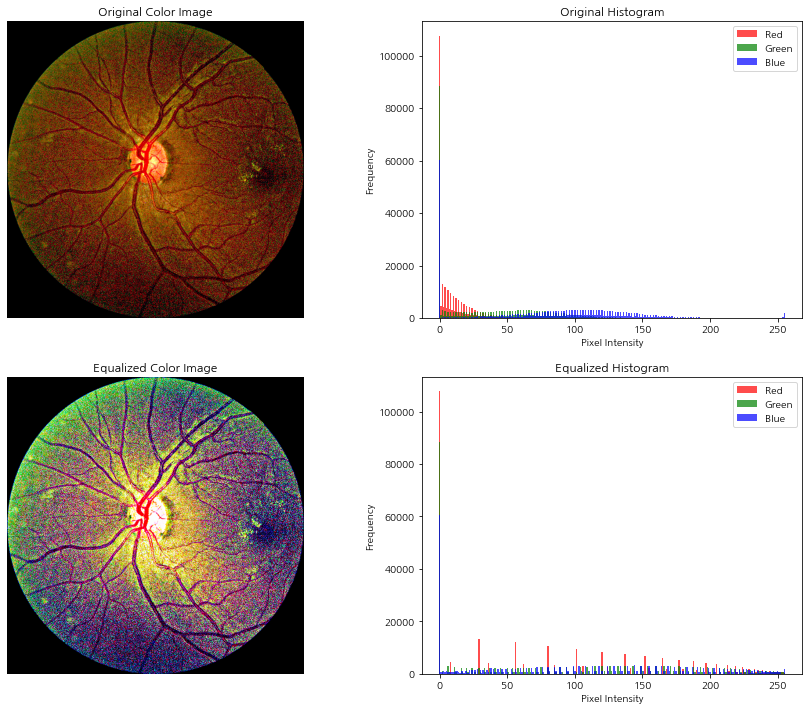

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 이미지 경로
image_path = r"../data/FGADR/s_0902_1.png"

# 컬러 이미지로 읽기
image_color = cv2.imread(image_path, cv2.IMREAD_COLOR)

# 각 채널에 대해 히스토그램 균등화 수행
equalized_channels = [cv2.equalizeHist(channel) for channel in cv2.split(image_color)]

# 균등화된 채널을 합치기
equalized_image = cv2.merge(equalized_channels)

# 각 채널에 대해 히스토그램 계산
hist_original_channels = [np.histogram(channel.flatten(), bins=256, range=[0, 256]) for channel in cv2.split(image_color)]
hist_equalized_channels = [np.histogram(channel.flatten(), bins=256, range=[0, 256]) for channel in cv2.split(equalized_image)]

# 시각화
plt.figure(figsize=(15, 12))

# 원본 이미지와 히스토그램 플로팅
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(image_color, cv2.COLOR_BGR2RGB))
plt.title('Original Color Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.bar(range(256), hist_original_channels[0][0], color='red', alpha=0.7, width=1, label='Red')
plt.bar(range(256), hist_original_channels[1][0], color='green', alpha=0.7, width=1, label='Green')
plt.bar(range(256), hist_original_channels[2][0], color='blue', alpha=0.7, width=1, label='Blue')
plt.title('Original Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()

# 균등화된 이미지와 히스토그램 플로팅
plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(equalized_image, cv2.COLOR_BGR2RGB))
plt.title('Equalized Color Image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.bar(range(256), hist_equalized_channels[0][0], color='red', alpha=0.7, width=1, label='Red')
plt.bar(range(256), hist_equalized_channels[1][0], color='green', alpha=0.7, width=1, label='Green')
plt.bar(range(256), hist_equalized_channels[2][0], color='blue', alpha=0.7, width=1, label='Blue')
plt.title('Equalized Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()

plt.show()


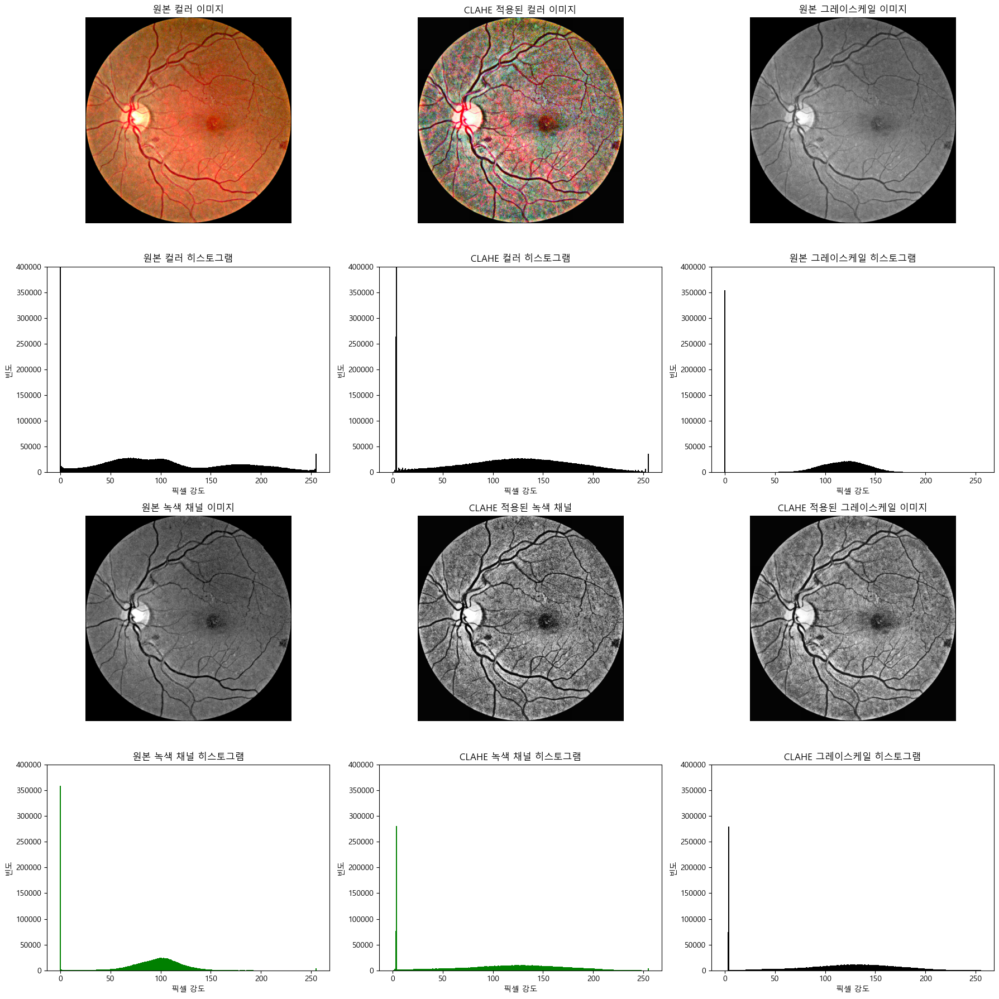

In [160]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# 이미지 경로
image_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\FGADR\Seg-set\Original_Images\0000_1.png"

# 컬러 이미지로 읽기
image_color = cv2.imread(image_path, cv2.IMREAD_COLOR)

# 그레이스케일 이미지로 변환
image_gray = cv2.cvtColor(image_color, cv2.COLOR_BGR2GRAY)

# 녹색 채널 추출
green_channel = image_color[:, :, 1]

# CLAHE 알고리즘 적용
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
clahe_color = cv2.merge([clahe.apply(channel) for channel in cv2.split(image_color)])
clahe_green = clahe.apply(green_channel)
clahe_gray = clahe.apply(image_gray)

# 히스토그램 계산
hist_color, bins_color = np.histogram(image_color.flatten(), bins=256, range=[0, 256])
hist_green, bins_green = np.histogram(green_channel.flatten(), bins=256, range=[0, 256])
hist_clahe_color, bins_clahe_color = np.histogram(clahe_color.flatten(), bins=256, range=[0, 256])
hist_clahe_green, bins_clahe_green = np.histogram(clahe_green.flatten(), bins=256, range=[0, 256])
hist_gray, bins_gray = np.histogram(image_gray.flatten(), bins=256, range=[0, 256])
hist_clahe_gray, bins_clahe_gray = np.histogram(clahe_gray.flatten(), bins=256, range=[0, 256])

# 시각화
plt.figure(figsize=(18, 18))

# 원본 컬러 이미지 및 히스토그램
plt.subplot(4, 3, 1)
plt.imshow(cv2.cvtColor(image_color, cv2.COLOR_BGR2RGB))
plt.title('원본 컬러 이미지')
plt.axis('off')

plt.subplot(4, 3, 4)
plt.bar(range(256), hist_color, color='black', width=1)
plt.title('원본 컬러 히스토그램')
plt.xlabel('픽셀 강도')
plt.ylabel('빈도')
plt.ylim(top=400000)

# CLAHE 적용된 컬러 이미지 및 히스토그램
plt.subplot(4, 3, 2)
plt.imshow(cv2.cvtColor(clahe_color, cv2.COLOR_BGR2RGB))
plt.title('CLAHE 적용된 컬러 이미지')
plt.axis('off')

plt.subplot(4, 3, 5)
plt.bar(range(256), hist_clahe_color, color='black', width=1)
plt.title('CLAHE 컬러 히스토그램')
plt.xlabel('픽셀 강도')
plt.ylabel('빈도')
plt.ylim(top=400000)

# 원본 녹색 채널 이미지 및 히스토그램
plt.subplot(4, 3, 7)
plt.imshow(green_channel, cmap='gray')
plt.title('원본 녹색 채널 이미지')
plt.axis('off')

plt.subplot(4, 3, 10)
plt.bar(range(256), hist_green, color='green', width=1)
plt.title('원본 녹색 채널 히스토그램')
plt.xlabel('픽셀 강도')
plt.ylabel('빈도')
plt.ylim(top=400000)

# CLAHE 적용된 녹색 채널 이미지 및 히스토그램
plt.subplot(4, 3, 8)
plt.imshow(clahe_green, cmap='gray', vmin=0, vmax=255)
plt.title('CLAHE 적용된 녹색 채널')
plt.axis('off')

plt.subplot(4, 3, 11)
plt.bar(range(256), hist_clahe_green, color='green', width=1)
plt.title('CLAHE 녹색 채널 히스토그램')
plt.xlabel('픽셀 강도')
plt.ylabel('빈도')
plt.ylim(top=400000)

# 원본 그레이스케일 이미지 및 히스토그램
plt.subplot(4, 3, 3)
plt.imshow(image_gray, cmap='gray')
plt.title('원본 그레이스케일 이미지')
plt.axis('off')

plt.subplot(4, 3, 6)
plt.bar(range(256), hist_gray, color='black', width=1)
plt.title('원본 그레이스케일 히스토그램')
plt.xlabel('픽셀 강도')
plt.ylabel('빈도')
plt.ylim(top=400000)

# CLAHE 적용된 그레이스케일 이미지 및 히스토그램
plt.subplot(4, 3, 9)
plt.imshow(clahe_gray, cmap='gray', vmin=0, vmax=255)
plt.title('CLAHE 적용된 그레이스케일 이미지')
plt.axis('off')

plt.subplot(4, 3, 12)
plt.bar(range(256), hist_clahe_gray, color='black', width=1)
plt.title('CLAHE 그레이스케일 히스토그램')
plt.xlabel('픽셀 강도')
plt.ylabel('빈도')
plt.ylim(top=400000)

plt.tight_layout()
plt.show()


In [35]:
import cv2
import numpy as np

def preprocess_image(image_path, img_size=(512, 512)):
    # 1. 검은 테두리 자르기
    original_image = cv2.imread(image_path)
    cropped_image = crop_black_borders(original_image)

    # 2. 대비 향상을 위한 CLAHE 적용
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    contrast_enhanced_image = apply_clahe(cropped_image, clahe)

    # 3. 보간법을 사용하여 크기 조정
    resized_image = resize_image(contrast_enhanced_image, img_size)

    # 4. [0, 1] 범위로 정규화
    normalized_image = resized_image.astype(np.float32) / 255.0

    return normalized_image

def crop_black_borders(image):
    # 컬러 이미지를 그레이스케일로 변환
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # 이미지를 이진화하여 임계값 적용
    _, thresholded = cv2.threshold(gray, 20, 255, cv2.THRESH_BINARY)

    # 픽셀 값이 0이 아닌 값들의 contour를 찾음
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 픽셀 값이 0이 아닌 값들의 bounding box를 찾음
    x, y, w, h = cv2.boundingRect(np.vstack(contours))

    # 찾은 bounding box를 사용하여 이미지를 자름
    cropped_image = image[y:y+h, x:x+w]

    return cropped_image


def apply_clahe(image, clahe):
    # LAB 색 공간으로 변환
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    # L 채널에 CLAHE 적용
    lab_image[:, :, 0] = clahe.apply(lab_image[:, :, 0])
    
    # BGR 색 공간으로 다시 변환
    enhanced_image = cv2.cvtColor(lab_image, cv2.COLOR_LAB2BGR)
    return enhanced_image

def resize_image(image, target_size):
    # 보간법을 사용하여 크기 조정
    resized_image = cv2.resize(image, target_size, interpolation=cv2.INTER_CUBIC)
    return resized_image


3504
2948


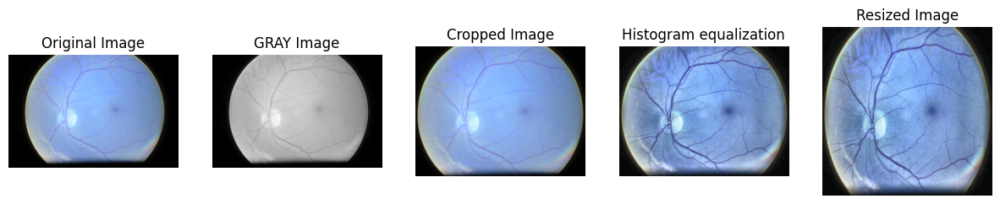

In [36]:
import matplotlib.pyplot as plt

def show_images_side_by_side(images, titles):
    # 여러 이미지를 양옆으로 나란히 출력하는 함수
    num_images = len(images)
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i in range(num_images):
        axes[i].imshow(images[i], cmap='gray' if len(images[i].shape)==2 else None)
        axes[i].set_title(titles[i])
        axes[i].axis('off')

    plt.show()

# 이미지 전처리 단계별 결과 확인
image_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\train\100_right.jpeg"
#image_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\IDRiD\A. Segmentation\A. Segmentation\1. Original Images\a. Training Set\IDRiD_274.jpg"

# 1. 원본 이미지
original_image = cv2.imread(image_path)
print(original_image[0].shape[0])
titles = ["Original Image"]

# 1.5 그레이스케일 이미지
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

titles.append("GRAY Image")

# 2. 모든 측면에서 빈 영역을 자른 이미지
cropped_image = crop_black_borders(original_image)
print(cropped_image[0].shape[0])
titles.append("Cropped Image")

# 3. 대비 향상을 위해 히스토그램 균등화를 적용한 이미지
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
contrast_enhanced_image = apply_clahe(cropped_image, clahe)
titles.append("Histogram equalization")

# 4. 리사이징한 이미지
resized_image = resize_image(contrast_enhanced_image, (512, 512))
titles.append("Resized Image")

# 모든 이미지를 양옆으로 출력
show_images_side_by_side([original_image, gray_image, cropped_image, contrast_enhanced_image, resized_image], titles)


In [41]:
import os
import cv2
from shutil import copyfile
from tqdm import tqdm

# def find_images_with_small_difference(image_folder, threshold=100):
#     # 이미지 폴더에서 파일 목록 읽기
#     image_files = os.listdir(image_folder)

#     # 차이가 100 미만인 이미지 파일명 찾기
#     small_difference_images = []
#     for image_file in tqdm(image_files, desc="Processing images", unit="image"):
#         original_image_path = os.path.join(image_folder, image_file)
#         original_image = cv2.imread(original_image_path)

#         # crop_black_borders 함수를 사용하여 자른 이미지
#         cropped_image = crop_black_borders(original_image)

#         # 차이가 threshold 미만이고 5 이상인지 확인
#         difference = abs(original_image[0].shape[0] - cropped_image[0].shape[0])
#         if 5 < difference < threshold:
#             small_difference_images.append(original_image_path)

#     return small_difference_images

# def save_images_to_folder(image_folder, output_folder, image_files):
#     # 결과를 저장할 폴더 생성
#     if not os.path.exists(output_folder):
#         os.makedirs(output_folder)

#     # 이미지를 결과 폴더에 복사
#     for image_file in tqdm(image_files, desc="Saving images", unit="image"):
#         original_image_path = os.path.join(image_folder, image_file)
#         output_image_path = os.path.join(output_folder, image_file)
#         copyfile(original_image_path, output_image_path)

def save_preprocessed_images_to_folder(image_folder, output_folder, exclude_files):
    # 결과를 저장할 폴더 생성
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # 이미지 폴더에서 파일 목록 읽기
    image_files = os.listdir(image_folder)

    # small_difference_files에 해당하지 않는 파일만 전처리 및 저장
    for image_file in tqdm(image_files, desc="Processing images", unit="image"):
        if image_file not in exclude_files:
            original_image_path = os.path.join(image_folder, image_file)
            output_image_path = os.path.join(output_folder, image_file)
            
            # Print the file name and shape of the loaded image
            original_image = cv2.imread(original_image_path)

           # 전처리 함수 호출 (정규화를 수행하도록 변경)
            preprocessed_image = preprocess_image(original_image_path)

            # 전처리된 이미지를 결과 폴더에 저장
            cv2.imwrite(output_image_path, preprocessed_image * 255.0)  # 정규화된 이미지를 다시 0~255 범위로 스케일링

# 이미지 폴더에서 차이가 100 미만인 파일명 찾기
image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\train"
output_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\preprocessed"

threshold_value = 200
#small_difference_files = find_images_with_small_difference(image_folder_path, threshold_value)

# small_difference_files에 해당하지 않는 파일들의 전처리 결과를 저장
save_preprocessed_images_to_folder(image_folder_path, output_folder_path, small_difference_files)


Processing images:   0%|          | 0/35123 [00:00<?, ?image/s]Processing images: 100%|██████████| 35123/35123 [2:55:46<00:00,  3.33image/s]  


In [25]:
print(len(small_difference_files))
print(small_difference_files)

1218
['10085_left.jpeg', '10085_right.jpeg', '10135_left.jpeg', '10135_right.jpeg', '10162_left.jpeg', '10272_left.jpeg', '10272_right.jpeg', '1030_left.jpeg', '1030_right.jpeg', '10320_right.jpeg', '10321_left.jpeg', '10321_right.jpeg', '10367_left.jpeg', '10367_right.jpeg', '10407_left.jpeg', '10407_right.jpeg', '10439_left.jpeg', '10439_right.jpeg', '10451_left.jpeg', '10451_right.jpeg', '10521_left.jpeg', '10521_right.jpeg', '10548_left.jpeg', '10548_right.jpeg', '1056_left.jpeg', '1056_right.jpeg', '10643_left.jpeg', '10643_right.jpeg', '10664_left.jpeg', '10664_right.jpeg', '10672_left.jpeg', '10672_right.jpeg', '10925_left.jpeg', '10925_right.jpeg', '10966_left.jpeg', '10966_right.jpeg', '11080_left.jpeg', '11080_right.jpeg', '1116_left.jpeg', '11229_left.jpeg', '11230_left.jpeg', '11230_right.jpeg', '11244_right.jpeg', '11283_left.jpeg', '11283_right.jpeg', '11299_left.jpeg', '11299_right.jpeg', '11301_left.jpeg', '11301_right.jpeg', '11321_left.jpeg', '11321_right.jpeg', '1136

In [21]:
image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\train"

# 이미지 폴더에서 파일 목록 읽기
image_files = os.listdir(image_folder_path)

# 8700번째 이미지 파일의 이름 출력
if len(image_files) > 21628:
    print(f"8700번째 이미지 파일의 이름: {image_files[21628]}")
else:
    print("이미지 파일이 8700개보다 적습니다.")

8700번째 이미지 파일의 이름: 34689_left.jpeg


In [ ]:
# 차이가 5이상 200미만인 이미지 원본과 전처리 결과 이미지 출력

#image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\train"
image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\5_200"

for image_file in small_difference_files:
    # 이미지 경로
    image_path = os.path.join(image_folder_path, image_file)

    # 1. 원본 이미지
    original_image = cv2.imread(image_path)
    titles = [f"Original Image - {image_file}"]
    images = [cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)]

    # 2. 최종 이미지
    preprocessed_image = preprocess_image(image_path, img_size=(512, 512))
    titles.append(f"result Image - {image_file}")
    images.append(cv2.cvtColor(preprocessed_image, cv2.COLOR_BGR2RGB))

    # 이미지 출력
    plt.figure(figsize=(15, 5))
    for i in range(len(images)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

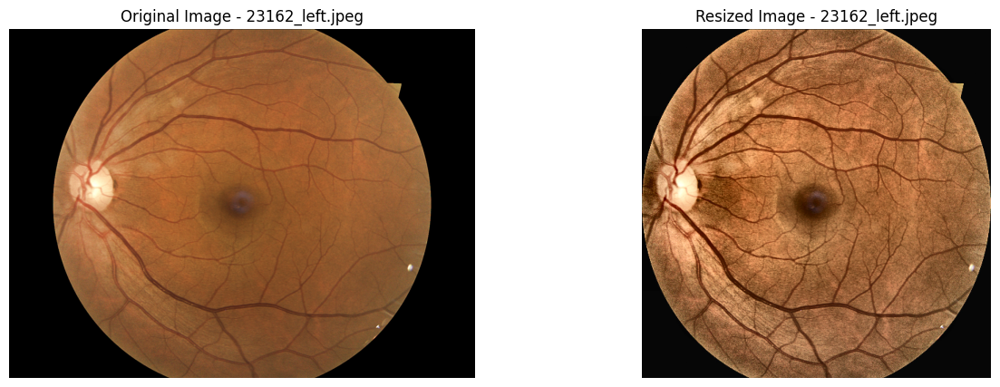

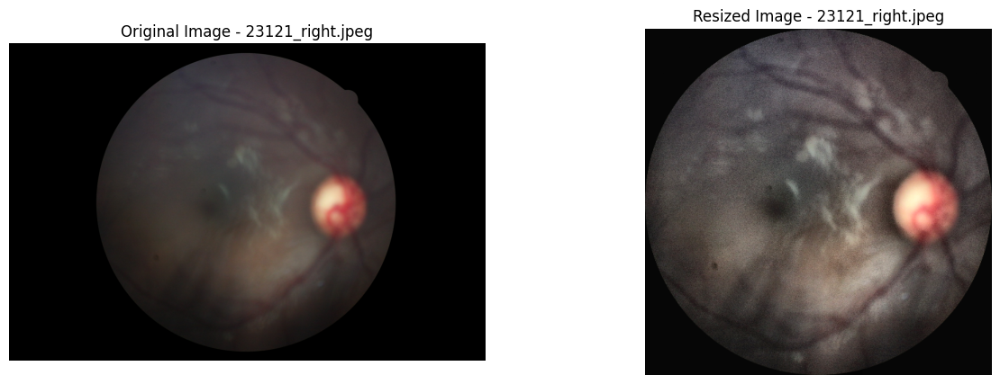

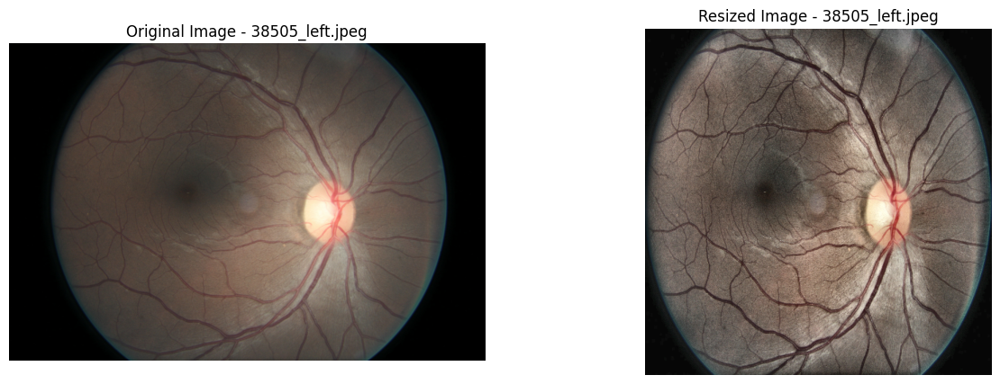

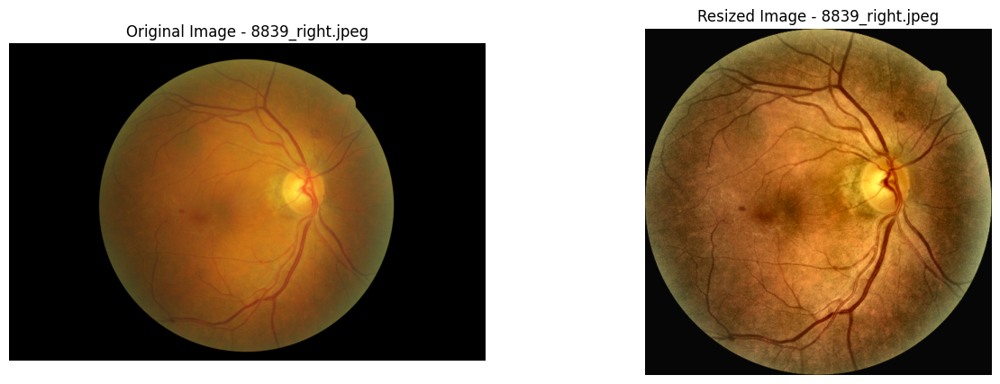

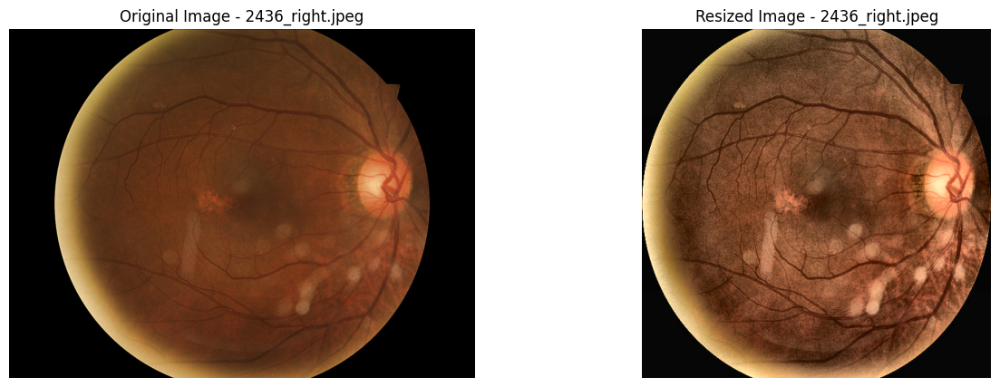

...

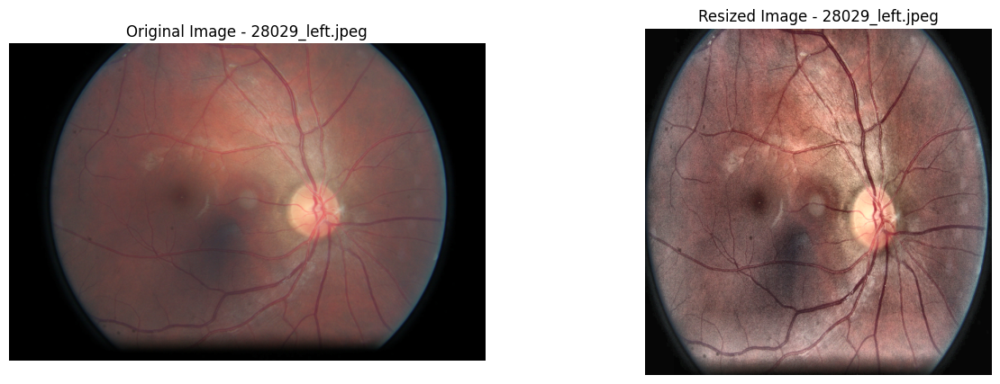

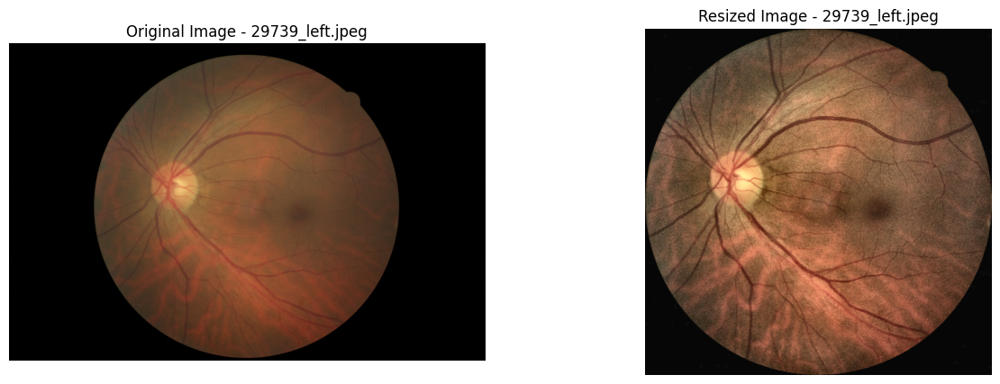

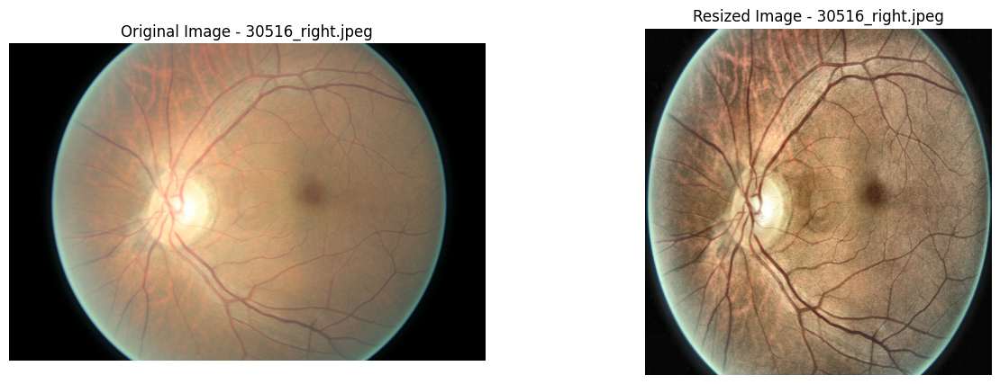

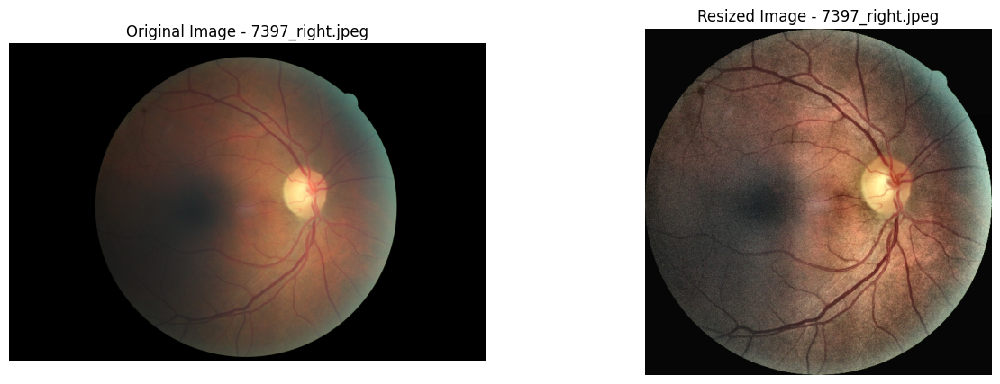

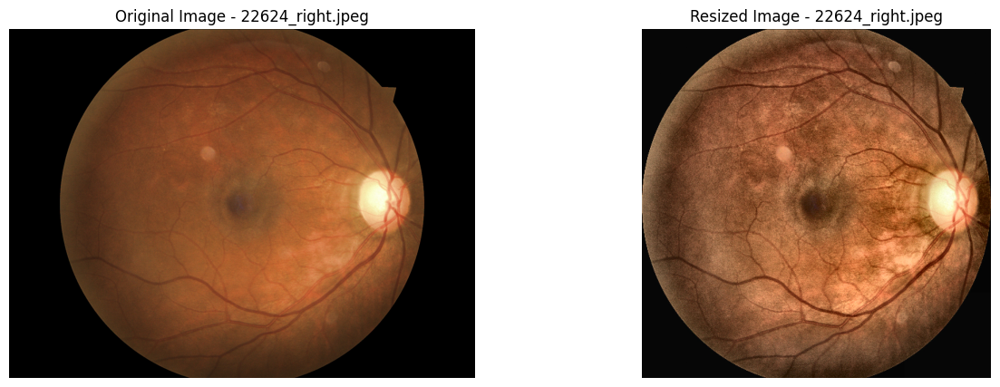

In [42]:
import os
import random
import matplotlib.pyplot as plt

# 이미지 파일이 들어있는 폴더 경로
image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\train"
#image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\5_200"
#image_folder_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\IDRiD\A. Segmentation\A. Segmentation\1. Original Images\a. Training Set"

# 폴더에서 이미지 파일 리스트 가져오기
image_files = [f for f in os.listdir(image_folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# 무작위로 20개의 이미지 선택
selected_images = random.sample(image_files, 20)

for image_file in selected_images:
    # 이미지 경로
    image_path = os.path.join(image_folder_path, image_file)

    # 1. 원본 이미지
    original_image = cv2.imread(image_path)
    titles = [f"Original Image - {image_file}"]
    images = [cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)]

    # 2. 리사이징한 이미지
    preprocessed_image = preprocess_image(image_path, img_size=(512, 512))
    titles.append(f"Resized Image - {image_file}")
    images.append(cv2.cvtColor(preprocessed_image, cv2.COLOR_BGR2RGB))

    # 이미지 출력
    plt.figure(figsize=(15, 5))
    for i in range(len(images)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.title(titles[i])
        plt.axis('off')
    plt.show()


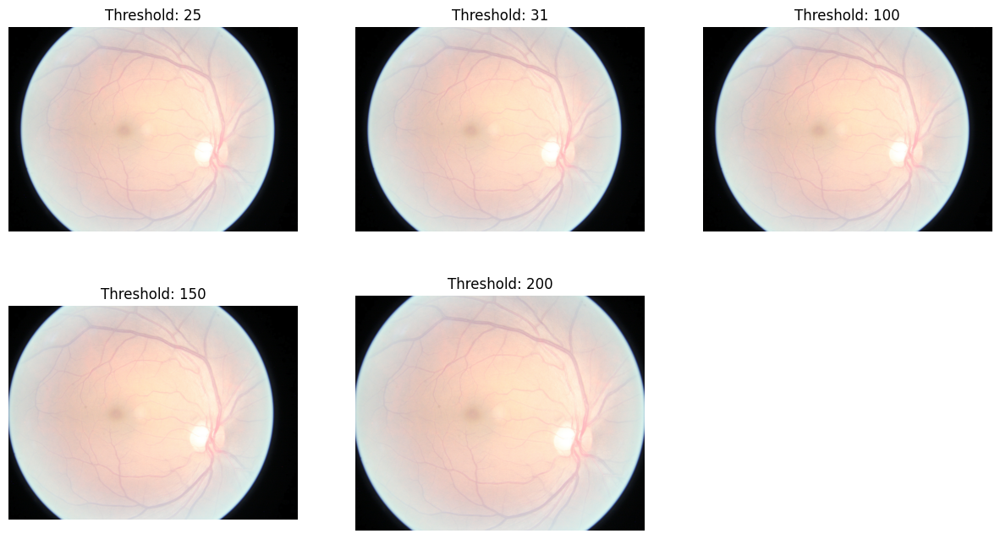

In [41]:
import cv2
import matplotlib.pyplot as plt

def crop_black_borders(image, threshold):
    # 컬러 이미지를 그레이스케일로 변환
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # 이미지를 이진화하여 임계값 적용
    _, thresholded = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)

    # 픽셀 값이 0이 아닌 값들의 contour를 찾음
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 픽셀 값이 0이 아닌 값들의 bounding box를 찾음
    x, y, w, h = cv2.boundingRect(np.vstack(contours))

    # 찾은 bounding box를 사용하여 이미지를 자름
    cropped_image = image[y:y+h, x:x+w]

    return cropped_image

# 예제 이미지 로드
image_path = r"D:\VS_Code\DN_project\DR-GeuAl\data\EyePACS\diabetic-retinopathy-detection\train\train\26514_right.jpeg"
original_image = cv2.imread(image_path)

# 여러 임계값에 대한 결과 시각화
thresholds = [25, 31, 100, 150, 200]
plt.figure(figsize=(15, 8))

for i, threshold in enumerate(thresholds, 1):
    result = crop_black_borders(original_image.copy(), threshold)
    plt.subplot(2, 3, i)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title(f'Threshold: {threshold}')
    plt.axis('off')

plt.show()

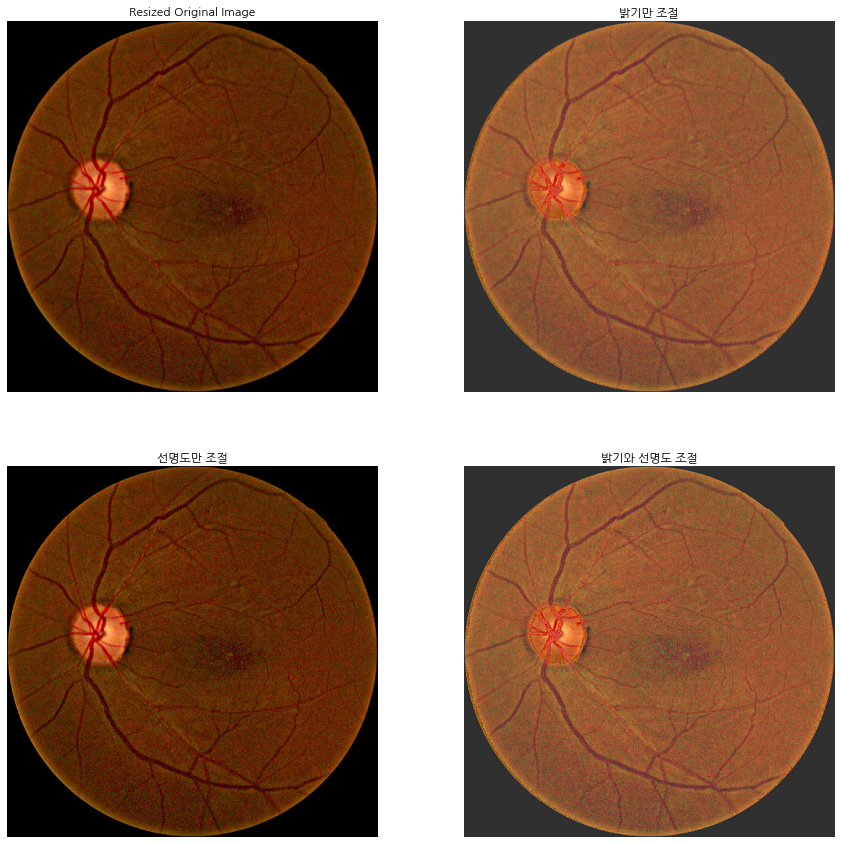

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc

font_path = "/usr/share/fonts/truetype/nanum/NanumGothic.ttf"
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

def adjust_brightness(image, threshold, increase_factor):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    L, A, B = cv2.split(lab)
    mask = L <= threshold
    L[mask] += increase_factor
    adjusted_lab = cv2.merge([L, A, B])
    adjusted_bgr = cv2.cvtColor(adjusted_lab, cv2.COLOR_LAB2BGR)
    return adjusted_bgr

def increase_sharpness(image, kernel_size=(5, 5), sigma=1.0, strength=1.0):
    blurred = cv2.GaussianBlur(image, kernel_size, sigma)
    sharpened = cv2.addWeighted(image, 1.0 + strength, blurred, -strength, 0)
    return sharpened


image = cv2.imread('../data/FGADR/Seg-set/Original_Images/1222_1.png')

resized_image = cv2.resize(image, (512, 512))

adjusted_brightness_image = adjust_brightness(resized_image, threshold=100, increase_factor=50)

sharpened_image = increase_sharpness(resized_image, kernel_size=(5, 5), sigma=1.0, strength=0.5)

adjusted_brightness_and_sharpness_image = increase_sharpness(adjusted_brightness_image, kernel_size=(5, 5), sigma=1.0, strength=0.5)

plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Resized Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(adjusted_brightness_image, cv2.COLOR_BGR2RGB))
plt.title('밝기만 조절')
plt.axis('off')
cv2.imwrite('../data/FGADR/b_1222_1.png', adjusted_brightness_image)

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2RGB))
plt.title('선명도만 조절')
plt.axis('off')
cv2.imwrite('../data/FGADR/s_1222_1.png', sharpened_image)

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(adjusted_brightness_and_sharpness_image, cv2.COLOR_BGR2RGB))
plt.title('밝기와 선명도 조절')
plt.axis('off')
cv2.imwrite('../data/FGADR/b_s_1222_1.png', adjusted_brightness_and_sharpness_image)

plt.show()



In [46]:
import cv2

#image = cv2.imread('../data/FGADR/Seg-set/Original_Images/0902_1.png')
image = cv2.imread('../data/FGADR/b_s_0902_1.png')

lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

L_channel = lab_image[:,:,0]

average_brightness = np.mean(L_channel)

print("평균적인 이미지 밝기:", average_brightness)


평균적인 이미지 밝기: 79.68098831176758


In [37]:
from tqdm import tqdm

image_files = [os.path.join(image_folder_path, file) for file in os.listdir(image_folder_path) if file.endswith('.png')]

brightness_data = []

for image_file in tqdm(image_files, desc='이미지 처리 중'):
    # 이미지 불러오기
    image = cv2.imread(image_file)
    # 이미지를 LAB 색 공간으로 변환
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    # L 채널에서 픽셀의 밝기 값만 추출
    L_channel = lab_image[:,:,0]
    # 밝기 값의 평균 계산
    average_brightness = np.mean(L_channel)
    # 데이터프레임에 추가
    brightness_data.append({'이미지 파일': os.path.basename(image_file), '평균 밝기': average_brightness})


brightness_df = pd.DataFrame(brightness_data)


print(brightness_df)


brightness_df.to_csv('../data/FGADR/average_brightness.csv', index=False)


이미지 처리 중: 100%|██████████| 1842/1842 [01:36<00:00, 19.16it/s]


          이미지 파일       평균 밝기
0     1107_3.png  120.277015
1     0217_1.png   61.573509
2     0033_3.png   89.690245
3     0747_3.png   79.435847
4     1760_2.png   77.806437
...          ...         ...
1837  0497_2.png  115.972098
1838  0817_1.png   74.340330
1839  0138_1.png   94.438943
1840  0435_3.png   94.371604
1841  0287_1.png  102.891591

[1842 rows x 2 columns]
